In [1]:
import pandas as pd
from pandas.tseries.offsets import MonthEnd
import numpy as np
import matplotlib.pyplot as plt
import tqdm
import cufflinks as cf
cf.go_offline()
import quantstats as qs
qs.extend_pandas()
import plotly.offline as pyo
import warnings
warnings.filterwarnings("ignore")
# # 初始化 cufflinks
# pyo.init_notebook_mode(connected=True)

import sys
sys.path.append("G:/.shortcut-targets-by-id/1p2bBToTZ6FV-gNAJWu7x0hvv7GIILQYn/mbq")
from TQuantLab_Data.scripts.load_data import DataManager

manager = DataManager()

In [2]:
close_table = manager.tool_api_data('收盤價')['Close']

data_close = close_table.stack().reset_index(name = 'close').rename(columns={
    "mdate": "date",
    "coid": "stock_id",
})
data_close['date'] = pd.to_datetime(data_close['date'])  # 確保日期格式一致
data_close['return'] = data_close.groupby('stock_id')['close'].pct_change()

return_table = data_close.pivot(index='date', columns='stock_id', values='return')
exp_return = return_table.shift(-2)  #報酬率往前兩天

資料集 '收盤價' 包含其他欄位（['Close']），進行 pivot 操作。


In [3]:
data_close['is_price_event'] = data_close.groupby('stock_id')['close'].transform(lambda x: x > x.shift(1).cummax())
# 計算滾動窗口內是否有破新高事件
data_close['price_event'] = data_close.groupby('stock_id')['is_price_event'].transform(lambda x: x.rolling(window=10).sum() > 0)
data_close['MA20'] = data_close.groupby('stock_id')['close'].rolling(20).mean().reset_index(level=0, drop=True)
data_close['BB_20'] = data_close['MA20'] + 2 * data_close.groupby('stock_id')['close'].rolling(20).std().reset_index(level=0, drop=True)

def compute_rsi(data, window=14):
    """
    計算 RSI 指標
    :param data: DataFrame，包含 'close' 欄位
    :param window: RSI 計算的時間窗口 (預設 14 天)
    :return: RSI 數值
    """
    delta = data['close'].diff()  # 計算每日價格變動

    # 分別計算上漲和下跌的變動值
    gain = (delta.where(delta > 0, 0)).rolling(window=window).mean()
    loss = (-delta.where(delta < 0, 0)).rolling(window=window).mean()

    # 計算 RSI
    RS = gain / loss
    RSI = 100 - (100 / (1 + RS))

    return RSI

# 計算 RSI 並加入 DataFrame
data_close['RSI_14'] = compute_rsi(data_close)

# 設定短期和長期移動平均線 (以 20 日和 60 日為例)
short_window = 8  # 短期均線
long_window = 24   # 長期均線

# 計算短期與長期移動平均線
data_close['MA_s'] = data_close.groupby('stock_id')['close'].transform(lambda x: x.rolling(window=short_window).mean())
data_close['MA_l'] = data_close.groupby('stock_id')['close'].transform(lambda x: x.rolling(window=long_window).mean())

# 計算金叉條件 (短期均線向上突破長期均線)
data_close['is_golden_cross'] = (data_close.groupby('stock_id')['MA_s'].shift(1) <= data_close.groupby('stock_id')['MA_l'].shift(1)) & \
                                (data_close['MA_s'] > data_close['MA_l'])

# 過去 10 天內是否發生過金叉 (Rolling Window)
data_close['golden_cross'] = data_close.groupby('stock_id')['is_golden_cross'].transform(lambda x: x.rolling(window=10).sum() > 0)

data_close['close_rank'] = data_close.groupby('date')['close'].rank(pct=True, ascending=False)
data_close

,date,stock_id,close,return,is_price_event,price_event,MA20,BB_20,RSI_14,MA_s,MA_l,is_golden_cross,golden_cross,close_rank
0,2010-01-04,1101,34.30,NaN,False,False,NaN,NaN,NaN,NaN,NaN,False,False,0.334201
1,2010-01-04,1102,34.55,NaN,False,False,NaN,NaN,NaN,NaN,NaN,False,False,0.330729
2,2010-01-04,1103,18.40,NaN,False,False,NaN,NaN,NaN,NaN,NaN,False,False,0.634983
3,2010-01-04,1104,18.40,NaN,False,False,NaN,NaN,NaN,NaN,NaN,False,False,0.634983
4,2010-01-04,1108,9.03,NaN,False,False,NaN,NaN,NaN,NaN,NaN,False,False,0.907118
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5372554,2025-02-05,9951,55.10,0.001818,False,False,54.9950,57.116047,53.703372,55.56250,55.016667,False,True,0.413401
5372555,2025-02-05,9955,32.40,-0.007657,False,False,28.9325,31.603647,49.991097,29.56875,28.864583,False,True,0.622374
5372556,2025-02-05,9958,160.00,0.012658,False,False,158.4000,168.744589,57.337080,157.62500,160.270833,False,False,0.112436
5372557,2025-02-05,9960,25.50,0.000000,False,False,25.3450,25.564809,47.230339,25.35625,25.406250,False,False,0.742192


In [4]:
data_rev = manager.get_data('月營收',common_stock=True)
data_rev

,公司,年月,序號,營收發布日,營收發布時點,單月營收(千元),去年單月營收(千元),單月營收成長率％,單月營收與上月比％,累計營收(千元),...,去年近 3月累計營收(千元),近3月累計營收成長率％,近3月累計營收與上月比％,近3月累計營收變動率％,流通在外股數(千股),單月每股營收(元),累計每股營收(元),近12月每股營收(元),近 3月每股營收(元),備註說明
0,1101,2010-01-01,1,2010-02-10,-,NaN,NaN,28.31,13.66,NaN,...,NaN,1.05,4.66,2.22,3692176.0,NaN,NaN,NaN,NaN,
1,1101,2010-02-01,1,2010-03-10,-,NaN,NaN,-7.59,-25.70,NaN,...,NaN,5.30,-0.68,3.64,3692176.0,NaN,NaN,NaN,NaN,
2,1101,2010-03-01,1,2010-04-12,-,NaN,NaN,-2.49,26.78,NaN,...,NaN,5.32,2.37,6.42,3692176.0,NaN,NaN,NaN,NaN,
3,1101,2010-04-01,1,2010-05-10,-,NaN,NaN,15.44,-4.51,NaN,...,NaN,1.38,-3.74,-2.13,3692176.0,NaN,NaN,NaN,NaN,
4,1101,2010-05-01,1,2010-06-10,-,NaN,NaN,2.93,-3.11,NaN,...,NaN,4.67,4.97,3.44,3692176.0,NaN,NaN,NaN,NaN,
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
293317,9951,2024-12-01,1,2025-01-06,17:36:11,565206.0,454478.0,24.36,10.10,5519594.0,...,1466407.0,10.23,8.11,18.97,74900.0,7.55,73.69,73.69,21.58,
293318,9955,2024-12-01,1,2025-01-09,14:42:24,97140.0,89234.0,8.86,13.80,1195460.0,...,275535.0,2.15,3.21,-2.58,104514.0,0.93,11.44,11.44,2.69,
293319,9958,2024-12-01,1,2025-01-07,16:32:14,1364447.0,2135974.0,-36.12,33.28,12474490.0,...,4976017.0,-31.18,10.98,19.43,256897.0,5.31,48.56,48.56,13.33,
293320,9960,2024-12-01,1,2025-01-10,13:36:27,67384.0,56963.0,18.29,12.82,704358.0,...,229826.0,-16.39,5.69,-1.46,33593.0,2.01,20.97,20.97,5.72,


In [5]:
# data_rev=pd.read_table(r'rev.txt',encoding='ANSI',low_memory=False, on_bad_lines='skip')
data_rev = data_rev.dropna(subset=['營收發布日', '單月營收(千元)'])

# 日期格式調整
data_rev['營收發布日'] = data_rev['營收發布日'].astype(str)
data_rev['年月'] = data_rev['年月'].astype(str)
data_rev['營收發布日'] = pd.to_datetime(data_rev['營收發布日'], errors='coerce')
data_rev['年月'] = pd.to_datetime(data_rev['年月'], errors='coerce')

def update_date(row):
    year = row['年月'].year
    month = row['年月'].month + 1  # 月份加1
    day = row['營收發布日'].day  # 保持日期一致
    
    # 處理月份超過12的情況
    if month > 12:
        month = 1
        year += 1
    try:
        return row['營收發布日'].replace(year=year, month=month)
    except ValueError:
        # 若日期超出該月範圍，則選擇該月最後一天
        return pd.Timestamp(year, month, 1) + MonthEnd(0)

def adjust_release_date_to_trading_day(df, stock_return_df):
    # 使用stock_return_df的索引作為交易日期
    trading_dates = stock_return_df.index
    
    # 更新營收發布日的月份
    df['營收發布日'] = df.apply(update_date, axis=1)
    
    # 複製原始資料以保留股票代碼
    release_date = df['營收發布日']
    
    # 確保輸入日期格式正確
    if not isinstance(release_date, pd.Series):
        release_date = pd.Series(release_date)
    
    # 對每個發布日期找最近的之後交易日
    nearest_dates = []
    
    for date in release_date:
        # 過濾出大於等於發布日期的交易日
        future_trading_dates = trading_dates[trading_dates >= pd.Timestamp(date)]
        
        # 如果存在之後的交易日，選擇最近的一個
        if len(future_trading_dates) > 0:
            nearest_date = future_trading_dates[0]
        else:
            # 如果沒有之後的交易日，可以選擇最後一個交易日或者拋出異常
            nearest_date = trading_dates[-1]
        
        nearest_dates.append(nearest_date)
    
    # 更新營收發布日為最近的交易日
    df['營收發布日'] = nearest_dates
    
    return df

# 使用示例
data_rev = adjust_release_date_to_trading_day(data_rev, return_table)
data_rev.head()

,公司,年月,序號,營收發布日,營收發布時點,單月營收(千元),去年單月營收(千元),單月營收成長率％,單月營收與上月比％,累計營收(千元),...,去年近 3月累計營收(千元),近3月累計營收成長率％,近3月累計營收與上月比％,近3月累計營收變動率％,流通在外股數(千股),單月每股營收(元),累計每股營收(元),近12月每股營收(元),近 3月每股營收(元),備註說明
33270,1101,2013-01-01,1,2013-02-18,17:32:16,9134465.0,7125036.0,28.20,NaN,9134465.0,...,NaN,NaN,NaN,NaN,3692176.0,2.47,2.47,NaN,NaN,
33282,1102,2013-01-01,1,2013-02-18,15:25:05,6018213.0,3880184.0,55.10,NaN,6018213.0,...,NaN,NaN,NaN,NaN,3295536.0,1.83,1.83,NaN,NaN,
33294,1103,2013-01-01,1,2013-02-18,16:36:19,288455.0,355452.0,-18.85,NaN,288455.0,...,NaN,NaN,NaN,NaN,776829.0,0.37,0.37,NaN,NaN,
33306,1104,2013-01-01,1,2013-02-18,14:52:17,486481.0,318999.0,52.50,NaN,486481.0,...,NaN,NaN,NaN,NaN,603892.0,0.81,0.81,NaN,NaN,
33323,1108,2013-01-01,1,2013-02-18,16:44:22,481802.0,286229.0,68.33,NaN,481802.0,...,NaN,NaN,NaN,NaN,404738.0,1.19,1.19,NaN,NaN,


In [6]:
data_rev.columns

Index(['公司', '年月', '序號', '營收發布日', '營收發布時點', '單月營收(千元)', '去年單月營收(千元)',
       '單月營收成長率％', '單月營收與上月比％', '累計營收(千元)', '去年累計營收(千元)', '累計營收成長率％',
       '歷史最高單月營收(千元)', '歷史最高單月營收-年月', '與歷史最高單月營收比%', '歷史最低單月營收(千元)',
       '歷史最低單月營收-年月', '與歷史最低單月營收比%', '創新高/低(歷史)', '創新高/低(近一年)', '創新高/低(同月)',
       '創 N月新高/低 (月數)', '近12月累計營收(千元)', '去年近12月累計營收(千元)', '近12月累計營收成長率％',
       '近 3月累計營收(千元)', '去年近 3月累計營收(千元)', '近3月累計營收成長率％', '近3月累計營收與上月比％',
       '近3月累計營收變動率％', '流通在外股數(千股)', '單月每股營收(元)', '累計每股營收(元)', '近12月每股營收(元)',
       '近 3月每股營收(元)', '備註說明'],
      dtype='object')

In [7]:
data_rev_1 = data_rev.copy()
data_rev_1 = data_rev_1.rename(columns={
    "公司": "stock_id",
    "營收發布日": "date",
    "單月營收(千元)": "revenue"
})
data_rev_1['revenue'] = data_rev_1['revenue'] * 1000  # 將千元轉為元
# data_rev_1['yoy'] = data_rev_1.groupby('stock_id')['revenue'].pct_change(periods=12)

In [8]:
data_rev_1['is_rev_event'] = data_rev_1['創新高/低(歷史)'] == 'H'
# 計算滾動窗口內是否有破新高事件
data_rev_1['rev_event'] = data_rev_1.groupby('stock_id')['is_rev_event'].transform(lambda x: x.rolling(window=10).sum() > 0)
# 計算是否連續兩個月創新高
data_rev_1['consecutive_high'] = data_rev_1.groupby('stock_id')['is_rev_event'].transform(lambda x: x & x.shift(1))

data_high = data_rev_1[data_rev_1['is_rev_event']].copy()
data_high = data_high.reset_index(drop=True)
data_high

,stock_id,年月,序號,date,營收發布時點,revenue,去年單月營收(千元),單月營收成長率％,單月營收與上月比％,累計營收(千元),...,近3月累計營收變動率％,流通在外股數(千股),單月每股營收(元),累計每股營收(元),近12月每股營收(元),近 3月每股營收(元),備註說明,is_rev_event,rev_event,consecutive_high
0,1102,2013-01-01,1,2013-02-18,15:25:05,6.018213e+09,3880184.0,55.10,NaN,6018213.0,...,NaN,3295536.0,1.83,1.83,NaN,NaN,,True,False,False
1,1104,2013-01-01,1,2013-02-18,14:52:17,4.864810e+08,318999.0,52.50,NaN,486481.0,...,NaN,603892.0,0.81,0.81,NaN,NaN,,True,False,False
2,1108,2013-01-01,1,2013-02-18,16:44:22,4.818020e+08,286229.0,68.33,NaN,481802.0,...,NaN,404738.0,1.19,1.19,NaN,NaN,,True,False,False
3,1109,2013-01-01,1,2013-02-18,16:34:22,3.837800e+08,243533.0,57.59,NaN,383780.0,...,NaN,421001.0,0.91,0.91,NaN,NaN,,True,False,False
4,1110,2013-01-01,1,2013-02-18,14:45:38,1.796600e+08,115517.0,55.53,NaN,179660.0,...,NaN,572001.0,0.31,0.31,NaN,NaN,,True,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11958,8936,2024-12-01,1,2025-01-09,18:56:04,6.394850e+08,517011.0,23.69,45.82,5245526.0,...,20.05,248078.0,2.58,21.14,21.14,5.78,,True,True,False
11959,9907,2024-12-01,1,2025-01-10,14:16:27,4.496263e+09,3130310.0,43.64,34.63,44859298.0,...,-8.88,1579145.0,2.85,28.41,28.41,7.21,,True,True,False
11960,9917,2024-12-01,1,2025-01-10,14:06:14,1.719316e+09,1501787.0,14.48,9.95,17859305.0,...,6.74,451197.0,3.81,39.58,39.58,10.57,,True,True,True
11961,9930,2024-12-01,1,2025-01-09,14:26:16,1.273642e+09,1059358.0,20.23,9.38,13290553.0,...,3.83,248540.0,5.12,53.47,53.47,14.29,,True,True,False


In [9]:
data_high_index = data_high.set_index(['date','stock_id']).index
signal_matrix= pd.Series(1, index=data_high_index).unstack()

signal_matrix.columns = signal_matrix.columns.astype(str)
return_table.columns = return_table.columns.astype(str)
signal_matrix = signal_matrix.reindex( index = return_table.index, columns= return_table.columns).fillna(0)
signal_matrix

stock_id,1101,1102,1103,1104,1108,1109,1110,1201,1203,1210,...,9944,9945,9946,9949,9950,9951,9955,9958,9960,9962
date,,,,,,,,,,,,,,,,,,,,,
2010-01-04,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2010-01-05,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2010-01-06,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2010-01-07,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2010-01-08,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-01-21,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2025-01-22,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2025-02-03,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [10]:
# 設定持有天數
holding_days_list = [3, 5, 10, 15]
daily_returns = {}
cumulative_returns = {}
# 計算持有天數的訊號矩陣及累計報酬
for holding_days in holding_days_list:
    # 複製訊號矩陣並延長持有天數
    signal_holding = signal_matrix.copy()
    for day in range(1, holding_days):
        signal_holding += signal_matrix.shift(day)
    signal_holding = signal_holding.clip(upper=1)  # 確保訊號值為 1
    
    # 計算每日報酬
    signal_bool = signal_holding > 0  # 將訊號矩陣轉為布林矩陣
    daily_returns[holding_days] = exp_return.where(signal_bool).mean(axis=1).fillna(0)
    cumulative_returns[holding_days] = (signal_holding * exp_return).sum(axis=1).cumsum()

cumulative_returns_df = pd.DataFrame(cumulative_returns)

# 繪製累計報酬曲線
cumulative_returns_df.iplot(
    title="Cumulative Returns by Holding Period",
    xTitle="Date",
    yTitle="Cumulative Return",
    theme="white",
    legend=True,
    asFigure=False,
)

In [11]:
# 設定持有天數
holding_days = 15

signal_matrix15 = signal_matrix.copy()
for day in range(1, holding_days):
    signal_matrix15 += signal_matrix.shift(day)
signal_matrix15 = signal_matrix15.clip(upper=1)  # 確保訊號值為 1

daily_returns15 = (signal_matrix15 * return_table).replace(0, np.nan)
daily_returns15


stock_id,1101,1102,1103,1104,1108,1109,1110,1201,1203,1210,...,9944,9945,9946,9949,9950,9951,9955,9958,9960,9962
date,,,,,,,,,,,,,,,,,,,,,
2010-01-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2010-01-05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2010-01-06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2010-01-07,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2010-01-08,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-01-21,-0.001570,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2025-01-22,0.001572,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2025-02-03,-0.003140,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [12]:
data_bm=pd.read_table(r'Y9999.txt',encoding='ANSI',low_memory=False, on_bad_lines='skip')
data_bm['日報酬率 %'] = data_bm['收盤價(元)'].pct_change()
data_bm['年月日'] = data_bm['年月日'].astype(str)
data_bm['年月日'] = pd.to_datetime(data_bm['年月日'])
data_bm_1 = data_bm.set_index(['年月日','證券代碼'])['日報酬率 %'].unstack()
data_bm = data_bm.set_index(['年月日','證券代碼'])['日報酬率 %'].unstack().reset_index().rename(columns={
    "年月日": "date"
})
data_bm_1

證券代碼,Y9999 加權指數
年月日,
2010-01-04,NaN
2010-01-05,0.000433
2010-01-06,0.014153
2010-01-07,-0.010831
2010-01-08,0.005278
...,...
2025-01-17,0.005341
2025-01-20,0.005130
2025-01-21,0.001426


In [13]:
def calculate_volume_averages(trades_df, ret_df, benchmark_df):
    results = []
    
    for _, row in trades_df.iterrows():
        stock_code = row["stock_id"]
        entry_date = row["date"]
        
        # Check if the stock code exists in the return DataFrame
        if stock_code not in ret_df.columns:
            continue  # Skip this stock if not found
        
        try:
            after_ret15 = ret_df.loc[entry_date:, stock_code].iloc[0:15]
            exp_ret = ((after_ret15+1).prod()-1)
            after_benchmark15 = benchmark_df.loc[entry_date:, 'Y9999 加權指數'].iloc[0:15]
            exp_benchmark = ((after_benchmark15+1).prod()-1)
            
            # Store results
            results.append({
                "stock_id": stock_code,
                "date": entry_date,
                'cumprod_15': exp_ret,
                'excess_cumprod_15': (exp_ret - exp_benchmark)
            })
        except Exception as e:
            # Optional: log the error or handle specific exceptions
            print(f"Error processing {stock_code}: {e}")
            continue
    
    # Convert results to DataFrame
    result_df = pd.DataFrame(results)
    return result_df
cumprod_data = calculate_volume_averages(data_high, exp_return, data_bm_1)
cumprod_data = pd.merge(cumprod_data, data_high[['date', 'stock_id','consecutive_high']], on=['date', 'stock_id'], how='left')
cumprod_data

,stock_id,date,cumprod_15,excess_cumprod_15,consecutive_high
0,1102,2013-02-18,-0.004093,-0.017814,False
1,1104,2013-02-18,0.044510,0.030789,False
2,1108,2013-02-18,0.093294,0.079573,False
3,1109,2013-02-18,0.004785,-0.008937,False
4,1110,2013-02-18,0.037594,0.023873,False
...,...,...,...,...,...
11955,8936,2025-01-09,0.038462,0.068906,False
11956,9907,2025-01-10,0.027304,0.044046,False
11957,9917,2025-01-10,-0.004065,0.012677,True
11958,9930,2025-01-09,0.009063,0.039508,False


In [14]:
# cumprod15_matrix = cumprod_data.pivot(index='date', columns='stock_id', values='excess_cumprod_15')

In [15]:
market_cap_matrix = manager.tool_api_data('個股市值_元')['Market_Cap_Dollars']
data_cap = market_cap_matrix.stack().reset_index(name = 'cap').rename(columns={
    "mdate": "date",
    "coid": "stock_id",
})
data_cap['date'] = pd.to_datetime(data_cap['date'])  # 確保日期格式一致
data_cap['cap_rank'] = data_cap.groupby('date')['cap'].rank(pct = True, ascending=False)

資料集 '個股市值_元' 包含其他欄位（['Market_Cap_Dollars']），進行 pivot 操作。


In [16]:
# 合併兩個表格，使用日期和證券代碼作為鍵
merged = pd.merge(cumprod_data, data_cap, on=['date', 'stock_id'], how='left')

In [17]:
Excess_ret = merged['excess_cumprod_15'] - merged['excess_cumprod_15'].mean()
factor_rank = merged['cap_rank']
rank_range_n = 10
bt = pd.Series({f'{int(((_/rank_range_n)*100))}% ~ {int((_+1)/rank_range_n*100)}%':Excess_ret[(factor_rank>_/rank_range_n) & (factor_rank<=(_+1)/rank_range_n)].mean() for _ in tqdm.tqdm(range(rank_range_n))}).dropna(how = 'all')
bt.iplot(kind='bar',title='Capital Rank',xTitle='Rank',yTitle='Excess Return',theme='white',color='blue')

100%|██████████| 10/10 [00:00<00:00, 2563.60it/s]


In [18]:
merged = pd.merge(cumprod_data, data_close, on=['date', 'stock_id'], how='left')
Excess_ret = merged['excess_cumprod_15'] - merged['excess_cumprod_15'].mean()
factor_rank = merged['close_rank']
rank_range_n = 10
bt = pd.Series({f'{int(((_/rank_range_n)*100))}% ~ {int((_+1)/rank_range_n*100)}%':Excess_ret[(factor_rank>_/rank_range_n) & (factor_rank<=(_+1)/rank_range_n)].mean() for _ in tqdm.tqdm(range(rank_range_n))}).dropna(how = 'all')
bt.iplot(kind='bar',title='Close Rank',xTitle='Rank',yTitle='Excess Return',theme='white',color='blue')

100%|██████████| 10/10 [00:00<00:00, 2494.23it/s]


In [19]:
factor_rank = close_table.rank(axis = 1,pct = True)
rank_range_n = 10

bt = pd.concat({f'{int(((_/rank_range_n)*100))}% ~ {int((_+1)/rank_range_n*100)}%':cumprod15_matrix[(factor_rank>_/rank_range_n) & (factor_rank<=(_+1)/rank_range_n)].mean(axis = 1) - cumprod15_matrix.mean(axis=1) for _ in tqdm.tqdm(range(rank_range_n))}, axis = 1).dropna(how = 'all')
(bt.cagr()*100).iplot(kind = 'bar')
bt.fillna(0).cumsum().iplot()

  0%|          | 0/10 [00:00<?, ?it/s]


NameError: name 'cumprod15_matrix' is not defined

In [481]:
factor_rank = market_cap_matrix.rank(axis = 1,pct = True)
rank_range_n = 10

bt = pd.concat({f'{int(((_/rank_range_n)*100))}% ~ {int((_+1)/rank_range_n*100)}%':cumprod15_matrix[(factor_rank>_/rank_range_n) & (factor_rank<=(_+1)/rank_range_n)].mean(axis = 1) - cumprod15_matrix.mean(axis=1) for _ in tqdm.tqdm(range(rank_range_n))}, axis = 1).dropna(how = 'all')
(bt.cagr()*100).iplot(kind = 'bar')
bt.fillna(0).cumsum().iplot()

100%|██████████| 10/10 [00:00<00:00, 14.03it/s]


In [20]:
# 計算夏普值
sharpe_ratio_matrix = return_table.rolling(20).mean() / return_table.rolling(20).std()

data_sp = sharpe_ratio_matrix.stack().reset_index(name = 'sp').rename(columns={
    "mdate": "date",
    "coid": "stock_id",
})
data_sp['date'] = pd.to_datetime(data_sp['date'])  # 確保日期格式一致
data_sp['sp_rank'] = data_sp.groupby('date')['sp'].rank(pct = True)

In [43]:
merged = pd.merge(cumprod_data, data_sp, on=['date', 'stock_id'], how='left')
Excess_ret = merged['excess_cumprod_15'] - merged['excess_cumprod_15'].mean()
factor_rank = merged['sp_rank']
rank_range_n = 10
bt = pd.Series({f'{int(((_/rank_range_n)*100))}% ~ {int((_+1)/rank_range_n*100)}%':Excess_ret[(factor_rank>_/rank_range_n) & (factor_rank<=(_+1)/rank_range_n)].mean() for _ in tqdm.tqdm(range(rank_range_n))}).dropna(how = 'all')
bt.iplot(kind='bar',title='SP Rank',xTitle='Rank',yTitle='Excess Return',theme='white',color='blue')

100%|██████████| 10/10 [00:00<00:00, 3851.87it/s]


In [934]:
factor_rank = sharpe_ratio_matrix.rank(axis = 1,pct = True)
rank_range_n = 10

bt = pd.concat({f'{int(((_/rank_range_n)*100))}% ~ {int((_+1)/rank_range_n*100)}%':cumprod15_matrix[(factor_rank>_/rank_range_n) & (factor_rank<=(_+1)/rank_range_n)].mean(axis = 1) - cumprod15_matrix.mean(axis=1) for _ in tqdm.tqdm(range(rank_range_n))}, axis = 1).dropna(how = 'all')
(bt.cagr()*100).iplot(kind = 'bar')
bt.fillna(0).cumsum().iplot()

100%|██████████| 10/10 [00:02<00:00,  4.98it/s]


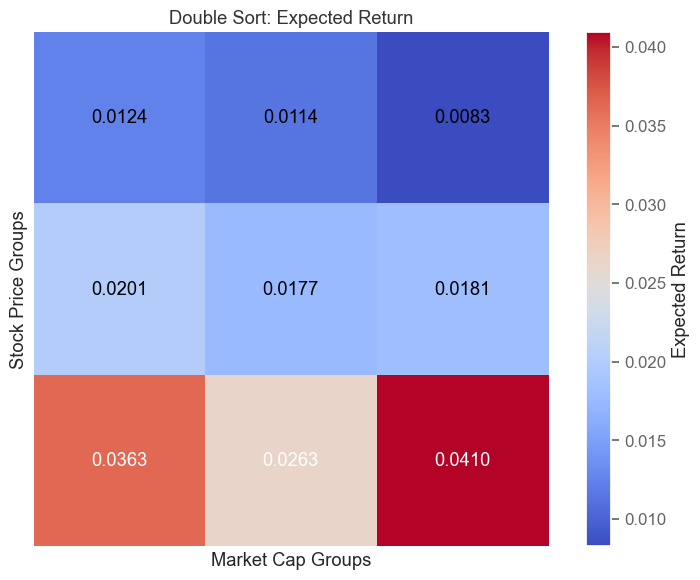

In [ ]:
data_close_cap = pd.merge(data_cap, data_close, on=['date', 'stock_id'], how='left')
data_test = pd.merge(cumprod_data, data_close_cap, on=['date', 'stock_id'], how='left')

# 刪除包含空值的行
data_test = data_test.dropna(subset=['cap', 'cumprod_15', 'return'])

# 設定分組數
n_bins = 3

# 對市值 (cap) 和股價 (close) 進行分組
data_test['cap_group'] = pd.qcut(data_test['cap'], n_bins, labels=False)
data_test['close_group'] = pd.qcut(data_test['close'], n_bins, labels=False)

# 計算每個市值和股價組合的平均報酬
results = pd.DataFrame(index=range(n_bins), columns=range(n_bins))

for i in range(n_bins):
    for j in range(n_bins):
        mask = (data_test['cap_group'] == i) & (data_test['close_group'] == j)
        mean_return = data_test.loc[mask, 'cumprod_15'].mean()
        results.loc[i, j] = mean_return

# 確保結果為數值型
results = results.astype(float)

def visualize_double_sort(results, xlabel="Group 1", ylabel="Group 2", title="Double Sort Results"):
    # 檢查數據類型
    if not np.issubdtype(results.values.dtype, np.number):
        raise ValueError("results 中包含非數值數據，請檢查數據！")

    # 繪製熱圖
    plt.figure(figsize=(8, 6))
    im = plt.imshow(results, cmap='coolwarm', interpolation='nearest', origin='lower')
    
    # 添加數字標籤
    for i in range(results.shape[0]):
        for j in range(results.shape[1]):
            value = results.iloc[i, j]
            plt.text(j, i, f"{value:.4f}", ha="center", va="center", color="black" if value < results.values.mean() else "white")

    # 添加色彩條
    plt.colorbar(im, label='Expected Return')
    
    # 調整軸標籤和順序
    plt.xticks(range(results.columns.size), [f"Cap {i+1}" for i in range(results.columns.size)], rotation=45)
    plt.yticks(range(results.index.size), [f"Close {i+1}" for i in range(results.index.size)])
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)

    # 移除網格線
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['bottom'].set_visible(False)
    plt.gca().spines['left'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.gca().set_xticks([])
    plt.gca().set_yticks([])
    plt.tight_layout()
    plt.show()

# 視覺化結果
visualize_double_sort(results, xlabel="Market Cap Groups", ylabel="Stock Price Groups", title="Double Sort: Expected Return")

In [21]:

# 中性化函數
def Neutralization(Y: pd.DataFrame, *X_list: pd.DataFrame, X_stack: pd.DataFrame = None) -> pd.DataFrame:
    """
    对因子 Y 进行中性化处理。
    参数:
    - Y: 目标因子 DataFrame
    - X_list: 需要中性化的参考因子列表

    返回:
    - 中性化后的 DataFrame
    """
    def get_rsid(X: np.ndarray, Y: np.ndarray):
        def get_beta(X: np.ndarray, Y: np.ndarray):
            # 计算回归系数
            coefficients = np.linalg.pinv(X.T @ X) @ X.T @ Y
            return coefficients
        
        coefficients = get_beta(X, Y)
        predicted_Y = X @ coefficients
        rsid = Y - predicted_Y
        return rsid

    # 数据预处理与分组计算
    Y_stack = Y.stack()
    Y_stack.index.names = ['date', 'order_book_id']
    if X_stack is not None:
        X = X_stack
    else:
        X = pd.concat({_ + 1: X_list[_] for _ in range(len(X_list))}, axis=1).stack()
    X.index.names = ['date', 'order_book_id']
    Neutralization_df = pd.concat([Y_stack, X], axis=1).dropna().groupby('date').apply(
        lambda data: pd.DataFrame(get_rsid(data.iloc[:, 1:].values, data.iloc[:, 0].values),
                                  columns=['rsid'], 
                                  index=data.index.get_level_values('order_book_id'))
    )['rsid']
    Neutralization_df.index.names = [None, 'order_book_id']
    return Neutralization_df.unstack().reindex_like(Y)


# 轉換資料格式為 DataFrame（目標格式為索引為日期，欄位為股票ID）
cap_matrix = data_close_cap.pivot(index='date', columns='stock_id', values='cap')
close_matrix = data_close_cap.pivot(index='date', columns='stock_id', values='close')

# 股價中性化跑市值
cap_neutralized = Neutralization(cap_matrix, close_matrix)
# 市值中性化跑股價
close_neutralized = Neutralization(close_matrix, cap_matrix)

NameError: name 'data_close_cap' is not defined

In [489]:
# factor = cap_neutralized.rolling(252).rank(ascending = False)
factor_rank = cap_neutralized.rank(axis = 1,pct = True)
rank_range_n = 10

bt = pd.concat({f'{int(((_/rank_range_n)*100))}% ~ {int((_+1)/rank_range_n*100)}%':cumprod15_matrix[(factor_rank>_/rank_range_n) & (factor_rank<=(_+1)/rank_range_n)].mean(axis = 1) - cumprod15_matrix.mean(axis=1) for _ in tqdm.tqdm(range(rank_range_n))}, axis = 1).dropna(how = 'all')
(bt.cagr()*100).iplot(kind = 'bar')
bt.fillna(0).cumsum().iplot()

100%|██████████| 10/10 [00:04<00:00,  2.06it/s]


In [490]:
factor_rank = close_neutralized.rank(axis = 1,pct = True)
rank_range_n = 10

bt = pd.concat({f'{int(((_/rank_range_n)*100))}% ~ {int((_+1)/rank_range_n*100)}%':cumprod15_matrix[(factor_rank>_/rank_range_n) & (factor_rank<=(_+1)/rank_range_n)].mean(axis = 1) - cumprod15_matrix.mean(axis=1) for _ in tqdm.tqdm(range(rank_range_n))}, axis = 1).dropna(how = 'all')
(bt.cagr()*100).iplot(kind = 'bar')
bt.fillna(0).cumsum().iplot()

100%|██████████| 10/10 [00:04<00:00,  2.29it/s]


In [22]:
outstanding_shares_matrix = manager.tool_api_data('流通在外股數_千股')['Outstanding_Shares_1000_Shares']*1000
Volume_matrix = manager.tool_api_data('成交量_千股')['Volume_1000_Shares']*1000

資料集 '流通在外股數_千股' 包含其他欄位（['Issue_Shares_1000_Shares', 'Outstanding_Shares_1000_Shares']），進行 pivot 操作。
資料集 '成交量_千股' 包含其他欄位（['Volume_1000_Shares']），進行 pivot 操作。


In [23]:
data_Volume = Volume_matrix.stack().reset_index(name = 'Volume').rename(columns={
    "mdate": "date",
    "coid": "stock_id",
})
data_Volume['date'] = pd.to_datetime(data_Volume['date'])
data_Volume['MA20'] = data_Volume.groupby('stock_id')['Volume'].rolling(20).mean().reset_index(level=0, drop=True)
data_Volume['BB_20'] = data_Volume['MA20'] + 1 * data_Volume.groupby('stock_id')['Volume'].rolling(20).std().reset_index(level=0, drop=True)
data_Volume['Surge Moments'] = data_Volume['Volume'] > data_Volume['BB_20']

In [24]:
turnover_rate_matrix = Volume_matrix / outstanding_shares_matrix

data_turnover = turnover_rate_matrix.stack().reset_index(name = 'turnover_rate').rename(columns={
    "mdate": "date",
    "coid": "stock_id",
})
data_turnover['date'] = pd.to_datetime(data_turnover['date'])
data_turnover['turnover_rate'] = data_turnover['turnover_rate'].rolling(3).mean()
data_turnover['turnover_rank'] = data_turnover.groupby('date')['turnover_rate'].rank(pct = True)

In [25]:
merged = pd.merge(cumprod_data, data_turnover, on=['date', 'stock_id'], how='left')
Excess_ret = merged['excess_cumprod_15'] - merged['excess_cumprod_15'].mean()
factor_rank = merged['turnover_rank']
rank_range_n = 10
bt = pd.Series({f'{int(((_/rank_range_n)*100))}% ~ {int((_+1)/rank_range_n*100)}%':Excess_ret[(factor_rank>_/rank_range_n) & (factor_rank<=(_+1)/rank_range_n)].mean() for _ in tqdm.tqdm(range(rank_range_n))}).dropna(how = 'all')
bt.iplot(kind='bar',title='turnover Rank',xTitle='Rank',yTitle='Excess Return',theme='white',color='blue')

100%|██████████| 10/10 [00:00<00:00, 1432.77it/s]


In [491]:
factor_rank = turnover_rate_matrix.rolling(5).mean().rank(axis = 1,pct = True)
rank_range_n = 10

bt = pd.concat({f'{int(((_/rank_range_n)*100))}% ~ {int((_+1)/rank_range_n*100)}%':cumprod15_matrix[(factor_rank>_/rank_range_n) & (factor_rank<=(_+1)/rank_range_n)].mean(axis = 1) - cumprod15_matrix.mean(axis=1) for _ in tqdm.tqdm(range(rank_range_n))}, axis = 1).dropna(how = 'all')
(bt.cagr()*100).iplot(kind = 'bar')
bt.fillna(0).cumsum().iplot()

100%|██████████| 10/10 [00:00<00:00, 13.98it/s]


In [30]:
turnover_rate_dt = turnover_rate_matrix.stack().reset_index(name = 'turnover_rate').rename(columns={
    "mdate": "date",
    "coid": "stock_id",
})
turnover_rate_dt['turnover_rate'] = turnover_rate_dt['turnover_rate'].shift(1)
turnover_rate_dt['bf_rolling5'] = turnover_rate_dt.groupby('stock_id')['turnover_rate'].rolling(5).mean().reset_index(level=0, drop=True)
turnover_rate_dt['turnover_rate_rank'] = turnover_rate_dt.groupby('date')['turnover_rate'].rank(pct=True)
turnover_rate_dt

,date,stock_id,turnover_rate,bf_rolling5,turnover_rate_rank
0,2010-01-04,1101,NaN,NaN,NaN
1,2010-01-04,1102,0.002521,NaN,0.166536
2,2010-01-04,1103,0.002186,NaN,0.140735
3,2010-01-04,1104,0.008018,NaN,0.398749
4,2010-01-04,1107,0.012449,NaN,0.543393
...,...,...,...,...,...
5578919,2025-01-22,9951,0.000161,0.001964,0.067236
5578920,2025-01-22,9955,0.000788,0.001068,0.313390
5578921,2025-01-22,9958,0.002813,0.002863,0.651852
5578922,2025-01-22,9960,0.006894,0.007524,0.838177


In [26]:
eps_table = manager.tool_api_data('母公司每股盈餘')['Basic_Earnings_Per_Share_TTM']

data_eps = eps_table.stack().reset_index(name = 'eps').rename(columns={
    "mdate": "date",
    "coid": "stock_id",
})
data_eps['date'] = pd.to_datetime(data_eps['date'])  # 確保日期格式一致
data_eps['is_eps_event'] = data_eps.groupby('stock_id')['eps'].transform(lambda x: x > x.shift(1).cummax())
# 計算滾動窗口內是否有破新高事件
data_eps['eps_event'] = data_eps.groupby('stock_id')['is_eps_event'].transform(lambda x: x.rolling(window=10).sum() > 0)
data_eps['eps_rank'] = data_eps.groupby('date')['eps'].rank(pct = True, ascending=False)

資料集 '母公司每股盈餘' 包含其他欄位（['Basic_Earnings_Per_Share_A', 'Basic_Earnings_Per_Share_Q', 'Basic_Earnings_Per_Share_TTM']），進行 pivot 操作。


In [27]:
merged = pd.merge(cumprod_data, data_eps, on=['date', 'stock_id'], how='left')
Excess_ret = merged['excess_cumprod_15'] - merged['excess_cumprod_15'].mean()
factor_rank = merged['eps_rank']
rank_range_n = 10
bt = pd.Series({f'{int(((_/rank_range_n)*100))}% ~ {int((_+1)/rank_range_n*100)}%':Excess_ret[(factor_rank>_/rank_range_n) & (factor_rank<=(_+1)/rank_range_n)].mean() for _ in tqdm.tqdm(range(rank_range_n))}).dropna(how = 'all')
bt.iplot(kind='bar',title='eps Rank',xTitle='Rank',yTitle='Excess Return',theme='white',color='blue')

100%|██████████| 10/10 [00:00<00:00, 1930.28it/s]


In [711]:
factor = eps_table.rolling(252).rank(ascending = False)
factor_rank = factor.rank(axis = 1,pct = True)
rank_range_n = 10

bt = pd.concat({f'{int(((_/rank_range_n)*100))}% ~ {int((_+1)/rank_range_n*100)}%':daily_returns15[(factor_rank>_/rank_range_n) & (factor_rank<=(_+1)/rank_range_n)].mean(axis = 1) - daily_returns15.mean(axis=1) for _ in tqdm.tqdm(range(rank_range_n))}, axis = 1).dropna(how = 'all')
(bt.cagr()*100).iplot(kind = 'bar')
bt.fillna(0).cumsum().iplot()

100%|██████████| 10/10 [00:02<00:00,  3.91it/s]


In [28]:
data_bm['year_line'] = data_bm['Y9999 加權指數'].rolling(window=252).mean()
# 判斷加權指數是否在年線以上
data_bm['above_year_line'] = data_bm['Y9999 加權指數'] > data_bm['year_line']
data_bm

證券代碼,date,Y9999 加權指數,year_line,above_year_line
0,2010-01-04,NaN,NaN,False
1,2010-01-05,0.000433,NaN,False
2,2010-01-06,0.014153,NaN,False
3,2010-01-07,-0.010831,NaN,False
4,2010-01-08,0.005278,NaN,False
...,...,...,...,...
3692,2025-01-17,0.005341,0.001185,True
3693,2025-01-20,0.005130,0.001207,True
3694,2025-01-21,0.001426,0.001220,True
3695,2025-01-22,0.009674,0.001246,True


In [29]:
merged = pd.merge(merged, data_bm, on=['date'], how='left')

In [30]:
ROE_matrix = manager.tool_api_data('常續ROE')['Return_Rate_on_Equity_A_percent_A']

data_ROE = ROE_matrix.stack().reset_index(name = 'ROE').rename(columns={
    "mdate": "date",
    "coid": "stock_id",
})
data_ROE['date'] = pd.to_datetime(data_ROE['date'])  # 確保日期格式一致
data_ROE['ROE_rank'] = data_ROE.groupby('date')['ROE'].rank(pct = True, ascending=False)

資料集 '常續ROE' 包含其他欄位（['Return_Rate_on_Equity_A_percent_A', 'Return_Rate_on_Equity_A_percent_Q', 'Return_Rate_on_Equity_A_percent_TTM']），進行 pivot 操作。


In [31]:
merged = pd.merge(cumprod_data, data_ROE, on=['date', 'stock_id'], how='left')
Excess_ret = merged['excess_cumprod_15'] - merged['excess_cumprod_15'].mean()
factor_rank = merged['ROE_rank']
rank_range_n = 10
bt = pd.Series({f'{int(((_/rank_range_n)*100))}% ~ {int((_+1)/rank_range_n*100)}%':Excess_ret[(factor_rank>_/rank_range_n) & (factor_rank<=(_+1)/rank_range_n)].mean() for _ in tqdm.tqdm(range(rank_range_n))}).dropna(how = 'all')
bt.iplot(kind='bar',title='ROE Rank',xTitle='Rank',yTitle='Excess Return',theme='white',color='blue')

100%|██████████| 10/10 [00:00<00:00, 4931.57it/s]


In [501]:
factor = ROE_matrix.rolling(252).rank(ascending = False)
factor_rank = ROE_matrix.rank(axis = 1,pct = True)
rank_range_n = 10

bt = pd.concat({f'{int(((_/rank_range_n)*100))}% ~ {int((_+1)/rank_range_n*100)}%':cumprod15_matrix[(factor_rank>_/rank_range_n) & (factor_rank<=(_+1)/rank_range_n)].mean(axis = 1) - cumprod15_matrix.mean(axis=1) for _ in tqdm.tqdm(range(rank_range_n))}, axis = 1).dropna(how = 'all')
(bt.cagr()*100).iplot(kind = 'bar')
bt.fillna(0).cumsum().iplot()

100%|██████████| 10/10 [00:00<00:00, 13.80it/s]


In [32]:
a = data_close.copy()
data_beta =  pd.merge(a, data_bm[['date', 'Y9999 加權指數']], on=['date'], how='left')
windows = 252
windows_corr = 252
correlation = data_beta.groupby('stock_id').apply(lambda x: x['return'].rolling(windows_corr).corr(x['Y9999 加權指數'])).reset_index(level = 0, drop = True)
standard = data_beta.groupby('stock_id').apply(lambda x: x['Y9999 加權指數'].rolling(windows).std()).reset_index(level = 0, drop = True)

data_beta['beta'] = (correlation) / standard
data_beta['beta_rank'] = data_beta.groupby('date')['beta'].rank(pct = True, ascending = False)

In [33]:
merged =  pd.merge(merged, data_beta, on=['date', 'stock_id'], how='left')
Excess_ret = merged['excess_cumprod_15'] - merged['excess_cumprod_15'].mean()
factor_rank = merged['beta_rank']
rank_range_n = 10
bt = pd.Series({f'{int(((_/rank_range_n)*100))}% ~ {int((_+1)/rank_range_n*100)}%':Excess_ret[(factor_rank>_/rank_range_n) & (factor_rank<=(_+1)/rank_range_n)].mean() for _ in tqdm.tqdm(range(rank_range_n))}).dropna(how = 'all')
bt.iplot(kind='bar',title='beta Rank',xTitle='Rank',yTitle='Excess Return',theme='white',color='blue')

100%|██████████| 10/10 [00:00<00:00, 626.83it/s]


In [34]:
Value_matrix = manager.tool_api_data('成交金額_元')['Value_Dollars']

data_Value = Value_matrix.stack().reset_index(name = 'Value').rename(columns={
    "mdate": "date",
    "coid": "stock_id",
})
data_Value['date'] = pd.to_datetime(data_Value['date'])  # 確保日期格式一致
data_Value['Value_rank'] = data_Value.groupby('date')['Value'].rank(pct = True, ascending=False)

資料集 '成交金額_元' 包含其他欄位（['Value_Dollars']），進行 pivot 操作。


In [35]:
merged =  pd.merge(cumprod_data, data_Value, on=['date', 'stock_id'], how='left')
Excess_ret = merged['excess_cumprod_15'] - merged['excess_cumprod_15'].mean()
factor_rank = merged['Value_rank']
rank_range_n = 10
bt = pd.Series({f'{int(((_/rank_range_n)*100))}% ~ {int((_+1)/rank_range_n*100)}%':Excess_ret[(factor_rank>_/rank_range_n) & (factor_rank<=(_+1)/rank_range_n)].mean() for _ in tqdm.tqdm(range(rank_range_n))}).dropna(how = 'all')
bt.iplot(kind='bar',title='Value Rank',xTitle='Rank',yTitle='Excess Return',theme='white',color='blue')

100%|██████████| 10/10 [00:00<00:00, 3342.87it/s]


In [36]:
merged = pd.merge(cumprod_data, data_cap, on=['date', 'stock_id'], how='left')
merged = pd.merge(merged, data_close, on=['date', 'stock_id'], how='left')
merged = pd.merge(merged, data_sp, on=['date', 'stock_id'], how='left')
merged = pd.merge(merged, data_turnover, on=['date', 'stock_id'], how='left')
merged = pd.merge(merged, data_eps, on=['date', 'stock_id'], how='left')
merged = pd.merge(merged, data_ROE, on=['date', 'stock_id'], how='left')
merged = pd.merge(merged, data_beta[['date', 'stock_id', 'beta', 'beta_rank']], on=['date', 'stock_id'], how='left')
merged = pd.merge(merged, data_Volume[['date', 'stock_id', 'Surge Moments']], on=['date', 'stock_id'], how='left')
merged = pd.merge(merged, data_Value[['date', 'stock_id', 'Value_rank']], on=['date', 'stock_id'], how='left')
merged = pd.merge(merged, data_bm, on=['date'], how='left')
merged


,stock_id,date,cumprod_15,excess_cumprod_15,consecutive_high,cap,cap_rank,close,return,is_price_event,...,eps_rank,ROE,ROE_rank,beta,beta_rank,Surge Moments,Value_rank,Y9999 加權指數,year_line,above_year_line
0,1102,2013-02-18,-0.004093,-0.017814,False,1.208363e+11,0.026439,37.40,0.005376,False,...,0.336554,3.72,0.478681,54.362543,0.265273,False,0.062208,0.004664,0.000059,True
1,1104,2013-02-18,0.044510,0.030789,False,1.005480e+10,0.200622,16.65,0.003012,False,...,0.423913,3.45,0.503620,46.762451,0.470257,False,0.346034,0.004664,0.000059,True
2,1108,2013-02-18,0.093294,0.079573,False,2.748171e+09,0.503888,6.79,0.008915,False,...,0.590982,-1.82,0.753017,53.193224,0.299035,False,0.797045,0.004664,0.000059,True
3,1109,2013-02-18,0.004785,-0.008937,False,4.420508e+09,0.374806,10.50,0.004785,False,...,0.655797,-0.46,0.708769,55.655177,0.230707,True,0.576983,0.004664,0.000059,True
4,1110,2013-02-18,0.037594,0.023873,False,7.722011e+09,0.247278,13.50,0.000000,False,...,0.655797,1.13,0.629928,54.369809,0.264469,False,0.786159,0.004664,0.000059,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11955,8936,2025-01-09,0.038462,0.068906,False,1.245352e+10,0.276923,50.20,-0.019531,False,...,0.347222,8.28,0.320416,25.201753,0.459906,False,0.300285,-0.013936,0.001161,False
11956,9907,2025-01-10,0.027304,0.044046,False,2.281865e+10,0.179487,14.45,-0.006873,False,...,0.646991,5.10,0.480914,28.430166,0.310731,True,0.402279,-0.003001,0.001116,False
11957,9917,2025-01-10,-0.004065,0.012677,True,5.572284e+10,0.082621,123.50,0.004065,False,...,0.164352,16.53,0.084442,24.608812,0.484670,False,0.292877,-0.003001,0.001116,False
11958,9930,2025-01-09,0.009063,0.039508,False,1.637881e+10,0.227920,65.90,-0.006033,False,...,0.267650,13.48,0.133603,20.543965,0.680425,True,0.645014,-0.013936,0.001161,False


In [37]:
merged['factor'] = merged[['cap_rank', 'close_rank', 'sp_rank']].sum(axis=1)
merged['factor_rank'] = merged.groupby('date')['factor'].rank(pct = True)

In [1006]:
Excess_ret = merged['excess_cumprod_15'] - merged['excess_cumprod_15'].mean()
factor_rank = merged['factor_rank']
rank_range_n = 10
bt = pd.Series({f'{int(((_/rank_range_n)*100))}% ~ {int((_+1)/rank_range_n*100)}%':Excess_ret[(factor_rank>_/rank_range_n) & (factor_rank<=(_+1)/rank_range_n)].mean() for _ in tqdm.tqdm(range(rank_range_n))}).dropna(how = 'all')
bt.iplot(kind='bar',title='factor Rank',xTitle='Rank',yTitle='Excess Return',theme='white',color='blue')

100%|██████████| 10/10 [00:00<00:00, 1894.96it/s]


In [595]:
merged.columns

Index(['stock_id', 'date', 'cumprod_15', 'excess_cumprod_15',
       'consecutive_high', 'cap', 'cap_rank', 'close', 'return',
       'is_price_event', 'price_event', 'MA20', 'BB_20', 'MA_s', 'MA_l',
       'is_golden_cross', 'golden_cross', 'close_rank', 'RSI_8', 'RSI_20',
       'RSI_14', 'sp', 'sp_rank', 'turnover_rate', 'turnover_rank', 'eps',
       'is_eps_event', 'eps_event', 'eps_rank', 'ROE', 'ROE_rank', 'beta',
       'beta_rank', 'Surge Moments', 'Value_rank', 'Y9999 加權指數', 'year_line',
       'above_year_line', 'factor', 'factor_rank'],
      dtype='object')

In [349]:
# filter11 = merged['close'] < merged['BB_20']
filter1 = merged['RSI_14'] < 80
filter2 = merged['factor_rank'] >= 0.3
data_bt = merged[ filter1 & filter2 ].copy()
data_bt

,stock_id,date,cumprod_15,excess_cumprod_15,consecutive_high,cap,cap_rank,close,return,is_price_event,...,ROE_rank,beta,beta_rank,Surge Moments,Value_rank,Y9999 加權指數,year_line,above_year_line,factor,factor_rank
2,1108,2013-02-18,0.093294,0.079573,False,2.748171e+09,0.503888,6.79,0.008915,False,...,0.753017,53.193224,0.299035,False,0.797045,0.004664,0.000059,True,1.715060,0.683761
3,1109,2013-02-18,0.004785,-0.008937,False,4.420508e+09,0.374806,10.50,0.004785,False,...,0.708769,55.655177,0.230707,True,0.576983,0.004664,0.000059,True,1.429265,0.512821
7,1229,2013-02-18,0.002584,-0.011137,False,1.653641e+10,0.133748,19.45,-0.002564,False,...,0.387772,59.963453,0.129421,False,0.379471,0.004664,0.000059,True,1.166061,0.341880
9,1232,2013-02-18,0.020794,0.007073,False,8.398683e+09,0.227838,52.50,-0.001901,False,...,0.072405,51.347436,0.356109,False,0.655521,0.004664,0.000059,True,1.201905,0.376068
10,1236,2013-02-06,-0.009091,-0.018419,False,2.367284e+09,0.541991,21.85,-0.006818,False,...,0.674578,35.150665,0.732315,False,0.845257,0.002499,0.000066,True,1.561931,0.666667
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11951,8416,2025-01-09,0.045181,0.075625,False,4.640662e+09,0.544729,164.50,-0.003030,False,...,0.136784,15.251854,0.856132,False,0.789744,-0.013936,0.001161,False,1.553859,0.641026
11953,8463,2025-01-09,-0.022358,0.008087,False,3.720000e+09,0.613675,24.80,-0.011952,False,...,0.333141,21.826172,0.625000,False,0.838746,-0.013936,0.001161,False,1.462963,0.615385
11954,8908,2025-01-10,0.008791,0.025533,True,1.396036e+10,0.258120,45.60,0.000000,False,...,0.275593,18.261404,0.771226,False,0.832479,-0.003001,0.001116,False,1.266465,0.541667
11956,9907,2025-01-10,0.027304,0.044046,False,2.281865e+10,0.179487,14.45,-0.006873,False,...,0.480914,28.430166,0.310731,True,0.402279,-0.003001,0.001116,False,1.242299,0.500000


In [350]:
exp_ret_df = pd.DataFrame()

# 針對篩選出的股票代碼進行計算
for symbol in data_bt['stock_id'].unique():
    symbol_events = data_bt[data_bt['stock_id'] == symbol]  # 篩選該股票的所有事件
    exp_ret_series = pd.Series(dtype='float64')  # 初始化該股票的報酬率序列
    
    for _, event in symbol_events.iterrows():
        try:
            # 獲取該股票在事件日之後的報酬率數據
            event_exp_ret = return_table[symbol].loc[event['date']:].iloc[2:15]

            # 停利條件：如果進場後第 3 天報酬率大於等於 9.5%，跳過
            if return_table[symbol].loc[event['date']:].iloc[3] >= 0.2:
                continue
            
            # 停損條件：累積虧損超過 20% 則提前結束
            for date in event_exp_ret.index:
                if ((event_exp_ret[:date] + 1).prod() - 1) <= -0.2:
                    event_exp_ret = event_exp_ret.loc[:date]  # 截取停損當日之前的資料
                    break
            
            # 合併該事件的報酬率到總序列中
            exp_ret_series = pd.concat([exp_ret_series, event_exp_ret])
        
        except Exception as e:
            print(f"Error for {symbol} on {event['data']}: {e}")

    # 將該股票的報酬率序列整合到資料框中
    exp_ret_series.sort_index(inplace=True)  # 按時間排序
    exp_ret_series.drop_duplicates(inplace=True)  # 移除重複值
    try:
        exp_ret_series = exp_ret_series.reindex(exp_return[symbol].index)
    except KeyError as e:
        continue
    exp_ret_df[symbol] = exp_ret_series  # 新增到結果資料框

Error processing 1231 on 2025-01-10 00:00:00: Length mismatch: Expected axis has 27 elements, new values have 31 elements
Error processing 1264 on 2025-01-08 00:00:00: Length mismatch: Expected axis has 29 elements, new values have 31 elements
Error processing 1419 on 2025-01-09 00:00:00: Length mismatch: Expected axis has 28 elements, new values have 31 elements
Error processing 1472 on 2025-01-10 00:00:00: Length mismatch: Expected axis has 27 elements, new values have 31 elements
Error processing 1524 on 2025-01-07 00:00:00: Length mismatch: Expected axis has 30 elements, new values have 31 elements
Error processing 1580 on 2025-01-08 00:00:00: Length mismatch: Expected axis has 29 elements, new values have 31 elements
Error processing 1618 on 2025-01-09 00:00:00: Length mismatch: Expected axis has 28 elements, new values have 31 elements
Error processing 1784 on 2025-01-10 00:00:00: Length mismatch: Expected axis has 27 elements, new values have 31 elements
Error processing 1786 on

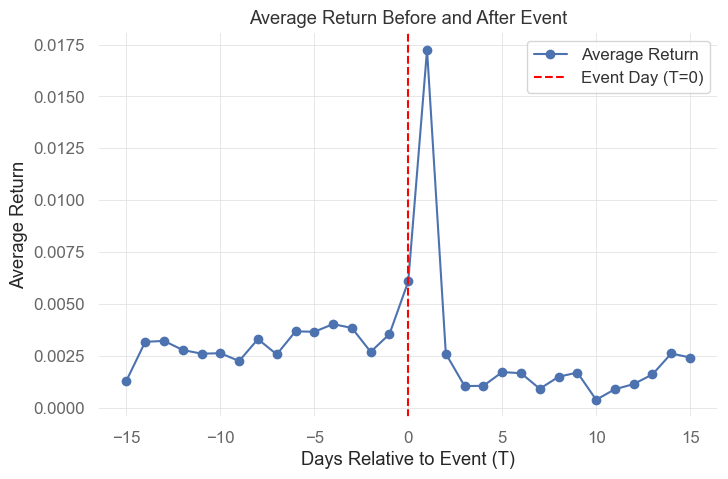

In [351]:
# 定義事件窗口
event_window = 15  # 前後 3 天
event_days = np.arange(-event_window, event_window + 1)

# 建立存放所有事件的報酬數據
aligned_events = []

for symbol in return_table.columns:
    stock_returns = return_table[symbol]  # 該股票的所有報酬數據
    
    for _, event in data_bt[data_bt['stock_id'] == symbol].iterrows():
        event_date = event['date']
        
        # 確保事件日期存在於報酬數據中
        if event_date not in stock_returns.index:
            continue
        
        try:
            # 取得事件發生日前後的報酬 (以 T=0 為基準)
            event_idx = stock_returns.index.get_loc(event_date)
            event_return = stock_returns.iloc[event_idx - event_window: event_idx + event_window + 1]

            # 重新索引，使其對齊 `event_days`（避免不同股票時間索引不一致）
            event_return.index = event_days

            # 加入對齊的事件報酬數據
            aligned_events.append(event_return)

        except Exception as e:
            print(f"Error processing {symbol} on {event_date}: {e}")

# 計算所有事件的平均報酬
aligned_events_df = pd.DataFrame(aligned_events)
mean_event_return = aligned_events_df.mean()

# 繪製事件窗口內的平均報酬變化
plt.figure(figsize=(8, 5))
plt.plot(event_days, mean_event_return, marker='o', linestyle='-', label="Average Return")
plt.axvline(x=0, color='red', linestyle='--', label="Event Day (T=0)")
plt.xlabel("Days Relative to Event (T)")
plt.ylabel("Average Return")
plt.title("Average Return Before and After Event")
plt.legend()
plt.grid(True)
plt.show()

In [352]:
aum = 5000000
stock_num = 10

In [353]:
# # 計算每天的信號數量（非 NaN 值數量）
# signal_series = exp_ret_df.notna().sum(axis=1)

# # 每支股票的收盤價從您提供的 DataFrame 中獲取

# close_prices = close_table.copy()  # DataFrame 名稱替換為實際名稱
# # 計算每天的信號數量，但不超過10
# stock_num_per_day = signal_series.clip(1, upper=stock_num)

# # 計算每個信號的持倉價值
# each_signal_value = ((aum / stock_num_per_day).values[:, None] // (close_prices * 1000)).fillna(0).astype(int) * close_prices
# each_signal_value.index = pd.to_datetime(each_signal_value.index, errors='coerce')

# # 計算每天的總持倉部位大小
# position_value_series = (each_signal_value.shift(1) * 1000)[exp_ret_df.notna()].sum(axis=1)

# # 打印歷史和近一年持倉部位大小的平均值
# print('歷史每天持倉部位大小:', position_value_series.mean().astype(int), 
#       '近一年每天持倉部位大小:', position_value_series[-252:].mean().astype(int))

# # 打印歷史和近一年信號數量的平均值和最大值
# print('歷史每天持股數:', signal_series.mean().round(2), 
#       '近一年每天持股數:', signal_series[-252:].mean().round(2), 
#       '近一年最大持股數:', signal_series[-252:].max())

# # 描述近一年每天的持股數量統計
# print(signal_series[:].describe())

# # 繪製信號數量的變化圖
# signal_series.iplot(title="每日信號數量變化", xTitle="日期", yTitle="信號數量")


In [354]:
# 計算每天的信號數量（非 NaN 值數量）
signal_series = exp_ret_df.notna().sum(axis=1)

# 每支股票的收盤價從您提供的 DataFrame 中獲取

close_prices = close_table.copy()  # DataFrame 名稱替換為實際名稱


# 計算每個信號的持倉價值
each_signal_value = ((aum / stock_num) // (close_prices * 1000)).fillna(0).astype(int) * close_prices
each_signal_value.index = pd.to_datetime(each_signal_value.index, errors='coerce')

# 計算每天的總持倉部位大小
position_value_series = (each_signal_value.shift(1) * 1000)[exp_ret_df.notna()].sum(axis=1)

# 打印歷史和近一年持倉部位大小的平均值
print('歷史每天持倉部位大小:', position_value_series.mean().astype(int), 
      '近一年每天持倉部位大小:', position_value_series[-252:].mean().astype(int))

# 打印歷史和近一年信號數量的平均值和最大值
print('歷史每天持股數:', signal_series.mean().round(2), 
      '近一年每天持股數:', signal_series[-252:].mean().round(2), 
      '近一年最大持股數:', signal_series[-252:].max())

# 描述近一年每天的持股數量統計
print(signal_series[:].describe())

# 繪製信號數量的變化圖
signal_series.iplot(title="每日信號數量變化", xTitle="日期", yTitle="信號數量")


歷史每天持倉部位大小: 12810141 近一年每天持倉部位大小: 12298936
歷史每天持股數: 27.64 近一年每天持股數: 28.97 近一年最大持股數: 93
count    3699.000000
mean       27.644228
std        29.815104
min         0.000000
25%         0.000000
50%        17.000000
75%        49.000000
max       121.000000
dtype: float64


In [355]:
def limit_true_values(df, data_sp, max_true=10):
    """
    限制每行的 True 數量為 max_true，並優先選擇 sp_rank 較高的股票。

    :param df: 布林 DataFrame，表示某條件是否成立 (True/False)
    :param data_sp: DataFrame，包含 sp_rank，根據 date 和 stock_id 進行匹配
    :param max_true: 每行最多允許的 True 數量
    :return: 限制後的布林 DataFrame
    """
    # 創建與輸入 DataFrame 相同形狀的結果 DataFrame
    result = df.copy()

    # 紀錄上一行選擇的 True 位置
    prev_true = np.array([], dtype=int)

    for i in range(len(df)):
        # 當前行的 True 股票
        current_true = np.where(df.iloc[i])[0]
        row_date = df.index[i]  # 獲取當前行的日期
        stock_ids = df.columns[current_true]  # 取得該行 True 的股票 ID
        
        # 透過日期 & stock_id 取得對應的 sp_rank
        rank_values = data_sp[data_sp['date'] == row_date].set_index('stock_id')['sp_rank']

        # 確保 shape_rank_values 的索引與 `df.columns` (股票代碼) 對應
        shape_rank_values = rank_values.reindex(stock_ids).dropna()

        # 如果 True 的數量超過 max_true，則篩選
        if len(current_true) > max_true:
            # 先保留與前一行相同的 True 位置
            keep = np.intersect1d(current_true, prev_true)

            # 如果仍然不足 max_true，則按照 sp_rank 降序排序
            if len(keep) < max_true:
                remaining = np.setdiff1d(current_true, keep)
                
                # 這裡改用 `.reindex(stock_ids[remaining])`
                sorted_remaining = remaining[np.argsort(-shape_rank_values.reindex(df.columns[remaining]).values)]
                keep = np.concatenate([keep, sorted_remaining[:max_true - len(keep)]])

            # 更新該行 True 位置
            result.iloc[i] = False  # 先全部設 False
            result.iloc[i, keep] = True  # 只保留篩選出的 True

        # 更新 prev_true 為當前行的 True 位置
        prev_true = np.where(result.iloc[i])[0]

    return result

# **示例使用**
signal_df = exp_ret_df.notna()  # 創建布林矩陣
signal_df = limit_true_values(signal_df, data_sp)  # 限制 True 數量，優先選擇高 sp_rank 股票

In [356]:
# def limit_true_values(df, max_true= 10):
#     # 創建一個與輸入 DataFrame 相同形狀的布爾數組
#     result = df.copy()
    
#     # 獲取上一行的 True 位置（初始為空）
#     prev_true = np.array([], dtype=int)
    
#     for i in range(len(df)):
#         # 獲取當前行的 True 位置
#         current_true = np.where(df.iloc[i])[0]
        
#         # 如果 True 的數量超過了限制
#         if len(current_true) > max_true:
#             # 優先保留與上一行相同的 True 位置
#             keep = np.intersect1d(current_true, prev_true)
            
#             # 如果保留的數量不足 max_true，則從剩餘的 True 中隨機選擇
#             if len(keep) < max_true:
#                 remaining = np.setdiff1d(current_true, keep)
#                 np.random.shuffle(remaining)
#                 keep = np.concatenate([keep, remaining[:max_true-len(keep)]])
            
#             # 將不在 keep 中的位置設為 False
#             result.iloc[i] = pd.Series([idx in keep for idx in range(len(df.columns))], index=df.columns)
        
#         # 更新 prev_true 為當前行的 True 位置22
#         prev_true = np.where(result.iloc[i])[0]
    
#     return result

# # 使用示例
# signal_df = exp_ret_df.notna()
# signal_df = limit_true_values(signal_df)

In [357]:
in_out_signal = exp_ret_df.notna().astype(int).diff().fillna(0)
fee_df = pd.DataFrame(index=in_out_signal.index, columns=in_out_signal.columns)
fee_df = fee_df.mask(in_out_signal == 1 , 0.001425*0.25)
fee_df = fee_df.mask((in_out_signal == -1).shift(-1).fillna(False) , 0.001425*0.25 + 0.003 + 0.002)
# fee_df = fee_df.mask((in_out_signal == -1) , 0.001425*0.25 + 0.003)

start_date = exp_ret_df.index.min()
end_date = exp_ret_df.index.max()

strategy_series = ((each_signal_value[signal_df]*1000 / aum)*((exp_ret_df.fillna(0) - fee_df.fillna(0)[signal_df])))[start_date:end_date].sum(axis=1)

# strategy_ret_series = strategy_series.shift(-1)
# qs.reports.full(strategy_series, data_bm['Y9999 加權指數'])

In [358]:
position_series = (each_signal_value[signal_df]*1000 / aum).sum(axis=1)
position_series.iplot()

In [359]:
import numpy as np
import pandas as pd
from scipy import stats
import quantstats as qs

def calculate_performance_metrics(strategy_ret_series, benchmark_ret_series, start_date, end_date, position_series):
    # Clean up NaNs for both series
    strategy_ret_series = strategy_ret_series.dropna()[start_date : end_date]
    benchmark_ret_series = benchmark_ret_series.dropna()[start_date : end_date]
    # strategy_signal_len = len(strategy_signal)
    # Weekly and Monthly returns
    strategy_weekly_returns = strategy_ret_series.resample('W').apply(lambda x: (x + 1).prod() - 1)
    strategy_monthly_returns = strategy_ret_series.resample('M').apply(lambda x: (x + 1).prod() - 1)
    
    benchmark_weekly_returns = benchmark_ret_series.resample('W').apply(lambda x: (x + 1).prod() - 1)
    benchmark_monthly_returns = benchmark_ret_series.resample('M').apply(lambda x: (x + 1).prod() - 1)

    def calculate_win_rates(returns):
        non_zero_days = (returns != 0).sum()
        daily_win_rate = (returns > 0).sum() / non_zero_days

        weekly_returns = returns.resample('W').apply(lambda x: (x + 1).prod() - 1)
        non_zero_weeks = (weekly_returns != 0).sum()
        weekly_win_rate = (weekly_returns > 0).sum() / non_zero_weeks

        monthly_returns = returns.resample('M').apply(lambda x: (x + 1).prod() - 1)
        non_zero_months = (monthly_returns != 0).sum()
        monthly_win_rate = (monthly_returns > 0).sum() / non_zero_months

        return daily_win_rate, weekly_win_rate, monthly_win_rate


    strategy_daily_win_rate, strategy_weekly_win_rate, strategy_monthly_win_rate = calculate_win_rates(strategy_ret_series)
    benchmark_daily_win_rate, benchmark_weekly_win_rate, benchmark_monthly_win_rate = calculate_win_rates(benchmark_ret_series)

    # Sharpe and Sortino Ratios for strategy
    excess_returns_strategy = strategy_ret_series / 252
    sharpe_ratio_strategy = np.sqrt(252) * excess_returns_strategy[excess_returns_strategy!=0].mean() / excess_returns_strategy[excess_returns_strategy!=0].std()
    sortino_ratio_strategy = np.sqrt(252) * strategy_ret_series[excess_returns_strategy!=0].mean() / strategy_ret_series[strategy_ret_series < 0].std()

    # Sharpe and Sortino Ratios for benchmark
    excess_returns_benchmark = benchmark_ret_series / 252
    sharpe_ratio_benchmark = np.sqrt(252) * excess_returns_benchmark.mean() / excess_returns_benchmark.std()
    sortino_ratio_benchmark = np.sqrt(252) * benchmark_ret_series.mean() / benchmark_ret_series[benchmark_ret_series < 0].std()

    # CAGR and Maximum Drawdown for strategy
    cagr_strategy = qs.stats.cagr(strategy_ret_series)
    mdd_strategy = qs.stats.max_drawdown(strategy_ret_series)

    # CAGR and Maximum Drawdown for benchmark
    cagr_benchmark = qs.stats.cagr(benchmark_ret_series)
    mdd_benchmark = qs.stats.max_drawdown(benchmark_ret_series)

    # Total Return for both
    total_ret_strategy = strategy_ret_series.sum()
    total_ret_benchmark = benchmark_ret_series.sum()

    # Daily, Weekly, and Monthly Volatility for both
    daily_volatility_strategy = strategy_ret_series.std()
    weekly_volatility_strategy = strategy_weekly_returns.std()
    monthly_volatility_strategy = strategy_monthly_returns.std()
    
    daily_volatility_benchmark = benchmark_ret_series.std()
    weekly_volatility_benchmark = benchmark_weekly_returns.std()
    monthly_volatility_benchmark = benchmark_monthly_returns.std()

    # Annualized Volatility for both
    annualized_volatility_strategy = daily_volatility_strategy * np.sqrt(252)
    annualized_volatility_benchmark = daily_volatility_benchmark * np.sqrt(252)

    # Profit-Loss Ratio for both
    avg_gain_strategy = strategy_ret_series[strategy_ret_series > 0].mean()
    avg_loss_strategy = abs(strategy_ret_series[strategy_ret_series < 0].mean())
    pl_ratio_strategy = avg_gain_strategy / avg_loss_strategy if avg_loss_strategy != 0 else np.nan

    avg_gain_benchmark = benchmark_ret_series[benchmark_ret_series > 0].mean()
    avg_loss_benchmark = abs(benchmark_ret_series[benchmark_ret_series < 0].mean())
    pl_ratio_benchmark = avg_gain_benchmark / avg_loss_benchmark if avg_loss_benchmark != 0 else np.nan

    # Longest Drawdown Days calculation
    def calculate_longest_dd_days(returns):
        cum_returns = (1 + returns).cumprod()
        running_max = cum_returns.cummax()
        drawdown = (cum_returns - running_max) / running_max
        drawdown_periods = (drawdown < 0).astype(int)
        longest_dd_days = drawdown_periods.groupby((drawdown_periods != drawdown_periods.shift()).cumsum()).sum().max()
        return longest_dd_days

    longest_dd_days_strategy = calculate_longest_dd_days(strategy_ret_series)
    longest_dd_days_benchmark = calculate_longest_dd_days(benchmark_ret_series)

    # Combine both strategy and benchmark metrics into a dictionary
    return {
        'Start_date': start_date,
        'End_date': end_date,
        'Strategy': {
            'Sharpe': sharpe_ratio_strategy.round(2),
            'Sortino': sortino_ratio_strategy.round(2),
            'Total_Ret': rf'{(total_ret_strategy * 100).round(2)}%',
            'CAGR': rf'{(cagr_strategy * 100).round(2)}%',
            'MDD': rf'{round((mdd_strategy * 100), 2)}%',
            'Longest DD': int(longest_dd_days_strategy),
            # 'Daily_Vol': rf'{int(daily_volatility_strategy * 10000)} bps',
            # 'Weekly_Vol': rf'{int(weekly_volatility_strategy * 10000)} bps',
            # 'Monthly_Vol': rf'{int(monthly_volatility_strategy * 10000)} bps',
            # 'Annualized_Vol': rf'{int(annualized_volatility_strategy * 10000)} bps',
            # 'P/L Ratio': pl_ratio_strategy.round(2),
            'Fund_Utiliz': rf'{round(position_series[start_date:end_date].mean()*100,2)}%',
            # 'Daily Win Rate': rf'{int(strategy_daily_win_rate * 100)}%',
            # 'Weekly Win Rate': rf'{int(strategy_weekly_win_rate * 100)}%',
            'Monthly Win Rate': rf'{int(strategy_monthly_win_rate * 100)}%',
            # 'Event Number': int(strategy_signal_len),
        },
        'Benchmark': {
            'Sharpe': sharpe_ratio_benchmark.round(2),
            'Sortino': sortino_ratio_benchmark.round(2),
            'Total_Ret': rf'{(total_ret_benchmark * 100).round(2)}%',
            'CAGR': rf'{(cagr_benchmark * 100).round(2)}%',
            'MDD': rf'{round((mdd_benchmark * 100), 2)}%',
            'Longest DD': int(longest_dd_days_benchmark),
            # 'Daily_Vol': rf'{int(daily_volatility_benchmark * 10000)} bps',
            # 'Weekly_Vol': rf'{int(weekly_volatility_benchmark * 10000)} bps',
            # 'Monthly_Vol': rf'{int(monthly_volatility_benchmark * 10000)} bps',
            # 'Annualized_Vol': rf'{int(annualized_volatility_benchmark * 10000)} bps',
            # 'P/L Ratio': pl_ratio_benchmark.round(2),
            'Fund_Utiliz': rf'100%',
            # 'Daily Win Rate': rf'{int(benchmark_daily_win_rate * 100)}%',
            # 'Weekly Win Rate': rf'{int(benchmark_weekly_win_rate * 100)}%',
            'Monthly Win Rate': rf'{int(benchmark_monthly_win_rate * 100)}%',
            # 'Event Number': int(strategy_signal_len),
        }
    }

In [360]:
metrics = calculate_performance_metrics(strategy_series, data_bm_1['Y9999 加權指數'], start_date, end_date, position_series)

In [361]:
strategy_metrics = pd.DataFrame(list(metrics['Strategy'].items()), columns=['Metric', 'Strategy'])
benchmark_metrics = pd.DataFrame(list(metrics['Benchmark'].items()), columns=['Metric', 'Benchmark'])
metrics_table = pd.merge(strategy_metrics, benchmark_metrics, on='Metric')
metrics_table

,Metric,Strategy,Benchmark
0,Sharpe,2.43,0.51
1,Sortino,3.46,0.66
2,Total_Ret,553.1%,120.64%
3,CAGR,41.82%,6.97%
4,MDD,-25.66%,-31.63%
5,Longest DD,190,825
6,Fund_Utiliz,57.04%,100%
7,Monthly Win Rate,72%,62%


In [368]:
strategy_series.loc['2013-06-05':].sharpe()

2.267575625038665

In [362]:
strategy_series.cumsum().add(1).iplot()
qs.stats.to_drawdown_series(strategy_series.cumsum().add(1)).iplot()